In [1]:
# The Object Detection API is written against Keras 2 (it uses
# `tf.keras.layers.experimental.SyncBatchNormalization`, which Keras 3 removed).
# TF 2.19 ships Keras 3, so route `tf.keras` back to the `tf-keras` package.
# This MUST happen before tensorflow is imported (restart the kernel if you
# already imported it).
import os
os.environ["TF_USE_LEGACY_KERAS"] = "1"

import tensorflow as tf
import cv2
print(tf.__version__)
print(tf.keras.__name__)  # -> tf_keras.api._v2.keras when the shim is active

import sys
print(sys.version)  # !python --version works fine locally too, this is the pure-Python equivalent
print(cv2.__version__)

2.19.1
tf_keras.api._v2.keras
3.12.13 (main, Mar  3 2026, 12:39:30) [Clang 17.0.0 (clang-1700.6.4.2)]
5.0.0


In [2]:
!git clone https://github.com/tensorflow/models.git

fatal: destination path 'models' already exists and is not an empty directory.


In [3]:
# Colab: !pip install lxml pillow  (plus tf-slim / lvis in the video)
# Locally everything goes into this project's uv venv instead of a system python.
# All of these are already declared in pyproject.toml; this cell is the
# "run it from the notebook" equivalent.
!uv pip install lxml pillow tf-slim lvis pycocotools contextlib2 tf-keras tensorflow-io grpcio-tools

Checked 9 packages in 27ms


## Installing the TF2 Object Detection API locally

The video does this on Colab, against a Google-Drive copy of the repo:

```python
%cd '/content/gdrive/My Drive/Colab/CV-TF1.X-2.X/5-Object_Detection/TF2ODAPI/models/research/'
!protoc object_detection/protos/*.proto --python_out=.

import os, sys
os.environ['PYTHONPATH'] += ':/content/.../models'
sys.path.append('/content/.../models/research')

%cd '/content/.../models/research/'
!cp object_detection/packages/tf2/setup.py .
!python setup.py build
!python setup.py install
```

The local equivalent, for the layout in this repo:

| Colab | here |
| --- | --- |
| `/content/gdrive/My Drive/.../TF2ODAPI/models` | `models/` (the clone two cells above, next to this notebook) |
| `%cd` + `!protoc` | `grpc_tools.protoc` from the venv — the Homebrew `protoc` (36.x) emits gencode that the pinned `protobuf` 5.29 runtime refuses to load |
| `sys.path.append(...)` + `PYTHONPATH` | same idea, but only needed until the package is installed |
| `python setup.py build && python setup.py install` | `uv pip install --no-deps models/research` (`setup.py install` is removed in modern setuptools) |

`--no-deps` matters: the API's `setup.py` asks for `tf-models-official`, `apache-beam`
and friends, which would drag in a different TensorFlow and break the Metal GPU
setup. The one feature extractor that genuinely needs `tf-models-official`
(EfficientDet / BiFPN) is made optional by the patch cell below.

In [4]:
# --- paths (the local stand-in for all the %cd calls) ---
from pathlib import Path

NOTEBOOK_DIR = Path.cwd()                                   # 54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2
MODELS_DIR   = NOTEBOOK_DIR / "models"                      # the `git clone` from the cell above
RESEARCH_DIR = MODELS_DIR / "research"
OD_DIR       = RESEARCH_DIR / "object_detection"
TF2ODAPI_DIR = NOTEBOOK_DIR / "code" / "5-Object_Detection" / "TF2ODAPI"

assert OD_DIR.is_dir(), f"clone models/ first: {OD_DIR} not found"
print(RESEARCH_DIR)
print(TF2ODAPI_DIR)

/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research
/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/TF2ODAPI


In [5]:
# --- !protoc object_detection/protos/*.proto --python_out=. ---
# Run protoc through grpcio-tools so the generated *_pb2.py matches the
# protobuf runtime pinned by TF 2.19 (5.29). Homebrew's protoc 36.x would give
# "Detected incompatible Protobuf Gencode/Runtime versions" at import time.
from importlib.resources import files
from grpc_tools import protoc

well_known = str(files("grpc_tools").joinpath("_proto"))
proto_files = sorted(str(p.relative_to(RESEARCH_DIR)) for p in OD_DIR.glob("protos/*.proto"))

rc = protoc.main(["protoc", f"-I{RESEARCH_DIR}", f"-I{well_known}",
                  f"--python_out={RESEARCH_DIR}", *proto_files])
assert rc == 0, f"protoc failed with {rc}"
print(f"compiled {len(proto_files)} .proto files ->",
      len(list(OD_DIR.glob('protos/*_pb2.py'))), "_pb2.py files")

compiled 34 .proto files -> 34 _pb2.py files


In [6]:
# --- os.environ['PYTHONPATH'] += ... ; sys.path.append(...) ---
# Same purpose as in the video: make `object_detection` and slim's `nets`
# importable straight from the clone. After the install cell below this is
# redundant, but it keeps the notebook runnable before/without the install.
import os, sys

for p in (str(RESEARCH_DIR), str(RESEARCH_DIR / "slim")):
    if p not in sys.path:
        sys.path.append(p)

os.environ["PYTHONPATH"] = os.pathsep.join(
    filter(None, [os.environ.get("PYTHONPATH", ""), str(MODELS_DIR), str(RESEARCH_DIR)])
)
print(os.environ["PYTHONPATH"])

/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models:/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research


In [7]:
# --- compatibility patch (no Colab equivalent; needed for TF 2.19 / Python 3.12) ---
# object_detection/builders/model_builder.py imports the EfficientDet-BiFPN
# feature extractor unconditionally, and that one needs `official.*` from
# tf-models-official. The versions of tf-models-official that still expose
# `official.vision.image_classification` do not import on Python 3.12, so make
# that single import optional. Idempotent: safe to re-run.
import re

mb = RESEARCH_DIR / "object_detection" / "builders" / "model_builder.py"
src = mb.read_text()

old_import = """  if sys.version_info[0] >= 3:
    from object_detection.models import ssd_efficientnet_bifpn_feature_extractor as ssd_efficientnet_bifpn
"""
new_import = """  # EfficientDet needs `tf-models-official` (the `official.*` package), which
  # does not install cleanly next to TF 2.19 on Python 3.12. Make it optional:
  # every other feature extractor keeps working without it.
  try:
    from object_detection.models import ssd_efficientnet_bifpn_feature_extractor as ssd_efficientnet_bifpn
  except ImportError:
    ssd_efficientnet_bifpn = None
"""
if old_import in src:
    src = src.replace(old_import, new_import)

# Move the 8 efficientnet entries out of the dict literal into a guarded update.
m = re.search(r"\n(      'ssd_efficientnet-b0_bifpn_keras':.*?"
              r"SSDEfficientNetB7BiFPNKerasFeatureExtractor,\n)  \}\n", src, re.S)
if m:
    entries = (m.group(1)
               .replace("      '", "        '")
               .replace("          ssd_", "            ssd_"))
    guarded = ("  }\n\n"
               "  if ssd_efficientnet_bifpn is not None:\n"
               "    SSD_KERAS_FEATURE_EXTRACTOR_CLASS_MAP.update({\n"
               + entries + "    })\n")
    src = src[:m.start()] + "\n" + guarded + src[m.end():]

changed = src != mb.read_text()
mb.write_text(src)
print("model_builder.py patched" if changed else "model_builder.py already patched")

model_builder.py already patched


In [8]:
# --- !cp object_detection/packages/tf2/setup.py .  +  build/install ---
import shutil, subprocess

shutil.copy(OD_DIR / "packages" / "tf2" / "setup.py", RESEARCH_DIR / "setup.py")

uv = shutil.which("uv")
assert uv, "uv not found on PATH - install it, or run `pip install --no-deps models/research` yourself"

# `python setup.py build && python setup.py install` in modern form.
# --no-deps keeps tf-models-official/apache-beam from replacing our TF 2.19 + Metal stack.
print(subprocess.run([uv, "pip", "install", "--no-deps", "--reinstall", str(RESEARCH_DIR)],
                     capture_output=True, text=True, check=True).stderr)

Resolved 1 package in 392ms
   Building object-detection @ file:///Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research
      Built object-detection @ file:///Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research
Prepared 1 package in 428ms
Uninstalled 1 package in 30ms
Installed 1 package in 5ms
 ~ object-detection==0.1 (from file:///Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research)



In [9]:
# --- verify the installation (the video's model_builder_tf2_test.py step) ---
from object_detection.builders import model_builder
from object_detection.utils import config_util, label_map_util, visualization_utils

configs = config_util.get_configs_from_pipeline_file(str(TF2ODAPI_DIR / "pipeline_bccd.config"))
detection_model = model_builder.build(model_config=configs["model"], is_training=True)

print("object_detection import OK")
print("model:", type(detection_model).__name__)
print("labels:", label_map_util.create_category_index_from_labelmap(
    str(TF2ODAPI_DIR / "label_map.pbtxt"), use_display_name=True))

object_detection import OK
model: FasterRCNNMetaArch
labels: {1: {'id': 1, 'name': 'Traffic light'}, 2: {'id': 2, 'name': 'Stop sign'}}


2026-09-05 13:34:51.993950: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2026-09-05 13:34:51.993973: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2026-09-05 13:34:51.993976: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
I0000 00:00:1788595491.993991  893260 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1788595491.994012  893260 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [11]:
# --- !python object_detection/builders/model_builder_tf2_test.py ---
# In the video the notebook's working directory IS models/research (because of
# the `%cd` above), so the relative path works. Here the notebook lives in the
# module folder, so run the test *in* RESEARCH_DIR with this venv's python and
# the Keras-2 shim enabled.
import subprocess, sys, os

env = {**os.environ, "TF_USE_LEGACY_KERAS": "1"}
proc = subprocess.run(
    [sys.executable, "object_detection/builders/model_builder_tf2_test.py"],
    cwd=RESEARCH_DIR, env=env, capture_output=True, text=True,
)
print(proc.stdout[-2000:])
print(proc.stderr[-2000:])   # absl/unittest write the test report to stderr



  ] ModelBuilderTF2Test.test_invalid_model_config_proto
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_invalid_model_config_proto): 0.0s
I0905 13:37:20.603290 8460689984 test_util.py:2634] time(__main__.ModelBuilderTF2Test.test_invalid_model_config_proto): 0.0s
[       OK ] ModelBuilderTF2Test.test_invalid_model_config_proto
[ RUN      ] ModelBuilderTF2Test.test_invalid_second_stage_batch_size
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_invalid_second_stage_batch_size): 0.0s
I0905 13:37:20.603623 8460689984 test_util.py:2634] time(__main__.ModelBuilderTF2Test.test_invalid_second_stage_batch_size): 0.0s
[       OK ] ModelBuilderTF2Test.test_invalid_second_stage_batch_size
[ RUN      ] ModelBuilderTF2Test.test_session
[  SKIPPED ] ModelBuilderTF2Test.test_session - Not a test.
[ RUN      ] ModelBuilderTF2Test.test_unknown_faster_rcnn_feature_extractor
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_unknown_faster_rcnn_feature_extractor): 0.0s
I0905 13:37:20.603

or use below one-liner

In [13]:
!cd {RESEARCH_DIR} && TF_USE_LEGACY_KERAS=1 {sys.executable} object_detection/builders/model_builder_tf2_test.py


Running tests under Python 3.12.13: /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/.venv/bin/python
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2026-09-05 13:38:09.093538: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M4
2026-09-05 13:38:09.093559: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2026-09-05 13:38:09.093562: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
I0000 00:00:1788595689.093573  900172 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1788595689.093591  900172 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
W0905 13:38:09.107120 8460689984 batch_n

In [12]:
# In [11]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display
import pathlib

In [14]:
# In [12]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

In [16]:
# # In [ ]:
# gpus = tf.config.experimental.list_physical_devices('GPU')
# for gpu in gpus:
#     tf.config.experimental.set_memory_growth(gpu, True)

In [17]:
# Cell [14]
def load_model(model_name):
    base_url = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
    model_file = model_name + '.tar.gz'
    model_dir = tf.keras.utils.get_file(
        fname=model_name,
        origin=base_url + model_file,
        untar=True)

    model_dir = pathlib.Path(model_dir)/"saved_model"

    model = tf.saved_model.load(str(model_dir))

    return model

# Cell [15]
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

# Cell [16] (not yet run)
#model_name = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8'
#model_name = 'efficientdet_d0_coco17_tpu-32'
model_name = 'centernet_resnet101_v1_fpn_512x512_coco17_tpu-8'
detection_model = load_model(model_name)

345992335/345992335 [==============================] - 97s 0us/step


In [18]:
# Cell [17]
print(detection_model.signatures['serving_default'].inputs)

# Output:
# [<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>, 
#  <tf.Tensor 'unknown:0' shape=<unknown> dtype=resource>, 
#  <tf.Tensor 'unknown_0:0' shape=<unkn...

[<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>, <tf.Tensor 'unknown:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_0:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_1:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_2:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_3:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_4:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_5:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_6:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_7:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_8:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_9:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_10:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_11:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_12:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_13:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_14:0' shape=<unknown> dtype=resource>, <

In [19]:
# Cell [18]
detection_model.signatures['serving_default'].output_dtypes

# Output:
# {'detection_boxes': tf.float32,
#  'detection_classes': tf.float32,
#  'detection_scores': tf.float32,
#  'num_detections': tf.float32}


{'detection_classes': tf.float32,
 'num_detections': tf.float32,
 'detection_boxes': tf.float32,
 'detection_scores': tf.float32}

In [20]:
# Cell (unnumbered, already run)
detection_model.signatures['serving_default'].output_shapes

# Output:
# {'detection_boxes': TensorShape([1, 100, 4]),
#  'detection_classes': TensorShape([1, 100]),
#  'detection_scores': TensorShape([1, 100]),
#  'num_detections': TensorShape([1])}

{'detection_classes': TensorShape([1, 100]),
 'num_detections': TensorShape([1]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'detection_scores': TensorShape([1, 100])}

In [21]:
def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy()
                   for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections

    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

    # Handle models with masks:
    if 'detection_masks' in output_dict:
        # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                  output_dict['detection_masks'], output_dict['detection_boxes'],
                   image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                           tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

    return output_dict

In [23]:
# Cell [21]
def show_inference_pics(model, image_path):
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = np.array(Image.open(image_path))
    # Actual detection.
    output_dict = run_inference_for_single_image(model, image_np)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks_reframed', None),
        use_normalized_coordinates=True,
        line_thickness=8)

    display(Image.fromarray(image_np))

In [26]:
# Cell [22]
# Local equivalent of the Colab Drive path.
# NOTE: ./imgs holds synthetic cartoon shapes (flat coloured rectangles) -- a
# COCO-trained model detects nothing in them. Use the real photographs that ship
# with the Object Detection API instead: image1.jpg (dogs), image2.jpg (people +
# kites on a beach), image3.jpg (person + workshop tools).
PATH_TO_TEST_IMAGES_DIR = OD_DIR / "test_images"
TEST_IMAGE_PATHS = sorted(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg"))
assert TEST_IMAGE_PATHS, f"no .jpg found in {PATH_TO_TEST_IMAGES_DIR}"
TEST_IMAGE_PATHS

[PosixPath('/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research/object_detection/test_images/image1.jpg'),
 PosixPath('/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research/object_detection/test_images/image2.jpg'),
 PosixPath('/Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/models/research/object_detection/test_images/image3.jpg')]

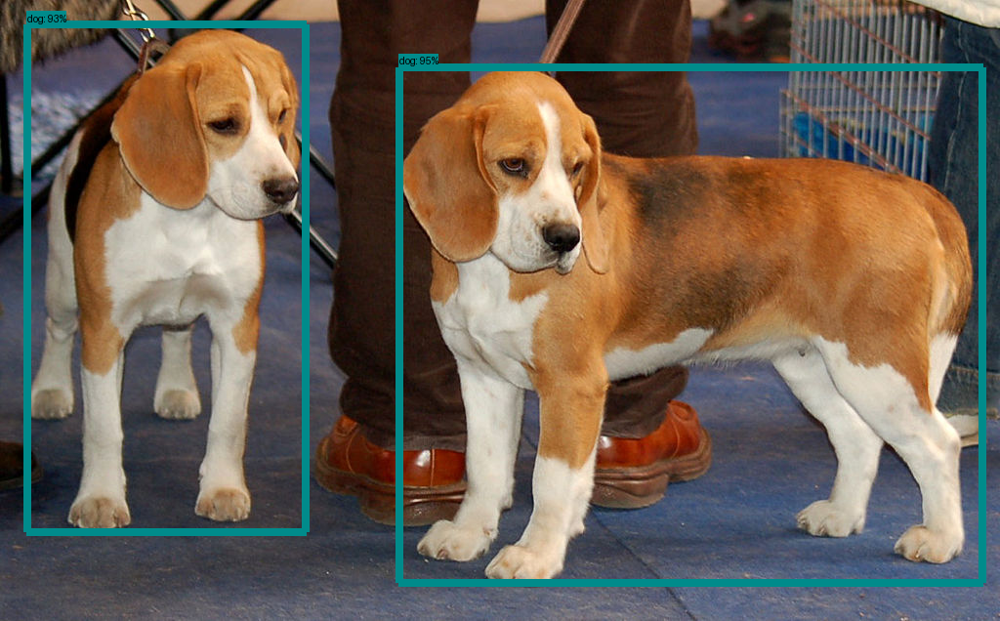

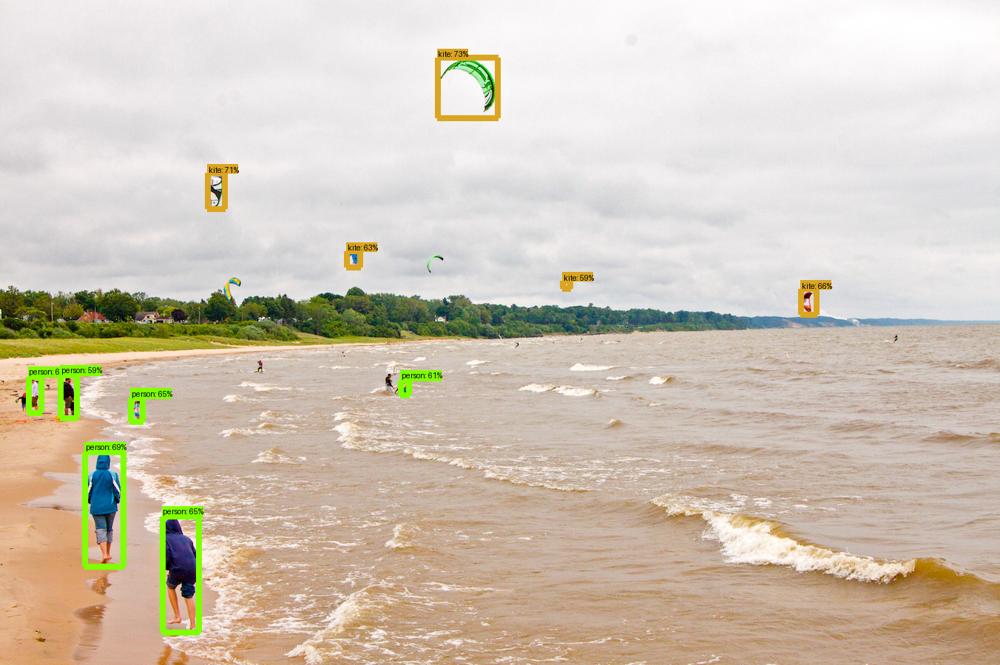

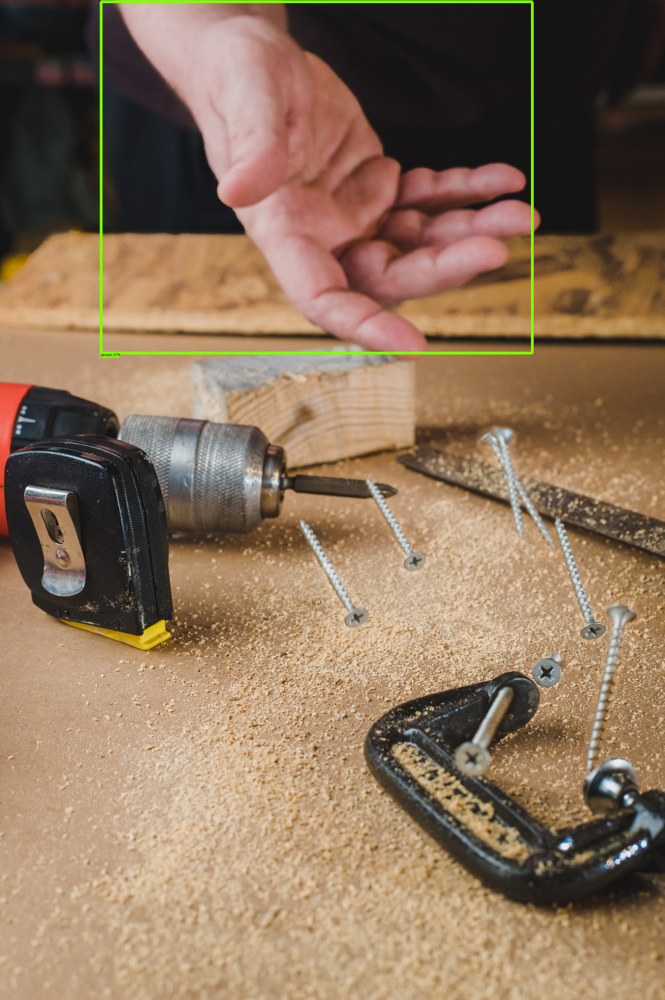

In [27]:
# Cell (currently executing)
for image_path in TEST_IMAGE_PATHS:
    show_inference_pics(detection_model, image_path)

In [28]:
# Cell [24]
# Local replacement for the Colab video cell.
# google.colab.patches.cv2_imshow does not exist outside Colab, and cv2.imshow
# needs a GUI window that a Jupyter kernel has not got -- so we write the
# annotated frames to a file and preview a frame inline instead.
import cv2


def run_inference_videos(model, input_path, output_path, max_frames=None, stride=1):
    """Annotate `input_path` with COCO detections and write `output_path`.

    max_frames : stop after this many *written* frames (None = whole clip).
                 CenterNet-ResNet101 on CPU is ~1-2 s/frame, so the full
                 2451-frame clip would take about an hour -- keep this small
                 for a first run.
    stride     : keep every Nth frame (2 = half the frames, 2x faster).
    """
    cap = cv2.VideoCapture(str(input_path))
    if not cap.isOpened():
        raise RuntimeError(f"could not open {input_path}")

    # Take the geometry from the file. The original hard-coded (1920, 1080),
    # which silently produces an unplayable output whenever the source is a
    # different size -- and this clip is 640x360.
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS) or 20.0
    print(f"input : {input_path}\n        {width}x{height} @ {fps:.1f} fps")

    output_path = str(output_path)
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(output_path, fourcc, fps / stride, (width, height))

    written = read = 0
    try:
        while True:
            ret, frame_bgr = cap.read()
            if not ret:
                break
            read += 1
            if (read - 1) % stride:
                continue

            # OpenCV decodes BGR; the model and vis_util both expect RGB.
            image_np = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

            output_dict = run_inference_for_single_image(model, image_np)
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np,
                output_dict["detection_boxes"],
                output_dict["detection_classes"],
                output_dict["detection_scores"],
                category_index,
                instance_masks=output_dict.get("detection_masks_reframed", None),
                use_normalized_coordinates=True,
                line_thickness=8)

            out.write(cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))
            written += 1
            if written % 10 == 0:
                print(f"  {written} frames written", end="\r")
            if max_frames and written >= max_frames:
                break
    finally:
        # Always release: the original only released inside the `q` branch, so a
        # normal end-of-video left the mp4 unfinalised and unplayable.
        cap.release()
        out.release()

    print(f"\nwrote {written} frames -> {output_path}")
    return output_path


input : /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/code/5-Object_Detection/darknetv3/R2D2.avi
        640x360 @ 20.0 fps
  60 frames written
wrote 60 frames -> /Users/ankit/Workspace/Projects/ankit-github/AI-ML-DS/54.Deep-Learning-for-Computer-Vision-with-TensorFlow-2/videos_out/R2D2-coco-output.mp4


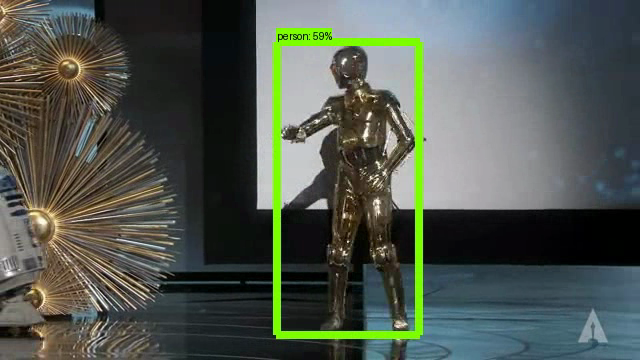

In [29]:
# Cell [25]
# The four clips under code/5-Object_Detection/ are all the same 640x360 footage
# (Oscars stage, then the Star Wars droids). Note they are the *outputs* of the
# earlier YOLO lessons, so some frames already have YOLO boxes burned into the
# pixels -- the COCO boxes we draw now are the ones with class names like
# `person`, `tv`, `chair`, `tie`.
VIDEO_IN = NOTEBOOK_DIR / "code" / "5-Object_Detection" / "darknetv3" / "R2D2.avi"
VIDEO_OUT_DIR = NOTEBOOK_DIR / "videos_out"
VIDEO_OUT_DIR.mkdir(exist_ok=True)
VIDEO_OUT = VIDEO_OUT_DIR / "R2D2-coco-output.mp4"

assert VIDEO_IN.is_file(), f"missing {VIDEO_IN}"

# Start with a short segment; drop max_frames once you know it works.
run_inference_videos(detection_model, VIDEO_IN, VIDEO_OUT, max_frames=60, stride=5)

# Preview the middle annotated frame inline.
cap = cv2.VideoCapture(str(VIDEO_OUT))
cap.set(cv2.CAP_PROP_POS_FRAMES, int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) // 2)
ok, frame = cap.read()
cap.release()
if ok:
    display(Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)))
